<a href="https://colab.research.google.com/github/temurera/Deep-Learning/blob/master/Unsupervised_AE_SHM_Numeric_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [3]:
!nvidia-smi

Sat Mar 19 12:48:16 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [33]:
%cd "/content/drive/My Drive/PhD_4th_Semester/SHM_PoliMI" 

#%python VAE_pre_proc.py
#from VAE_pre_proc import * # Loading the undamaged dataset

/content/drive/My Drive/PhD_4th_Semester/SHM_PoliMI


In [5]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import pickle
from scipy import *
from pylab import figure, show, setp
#from mpl_toolkits.mplot3d import Axes3D

from keras.layers import Input, Dropout, BatchNormalization, Activation
from keras.layers.recurrent import LSTM
import matplotlib.pyplot as plt
from keras import regularizers
from keras import optimizers, Sequential 
from keras.layers import RepeatVector
from keras.layers import TimeDistributed, Dense
from tensorflow.keras import layers
from tensorflow.keras import activations

from keras.regularizers import l1

#from VAE_pre_proc import * # Loading the undamaged dataset
from VAE_SHM_num_pre_proc import * # Loading the undamaged dataset
U = np.transpose(U)

In [6]:
latent_dim = 100
n_timesteps = 600
n_features = 1

encoder_inputs = keras.Input(shape=(n_timesteps,1,1))
x = layers.Reshape((n_timesteps, 1, 1))(encoder_inputs)
x = layers.Conv1D(kernel_size = 3, filters = 16, activation="tanh", strides=1, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.00001))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Conv1D(kernel_size = 7, filters = 32, activation="tanh", strides=1, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.00001))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Conv1D(kernel_size = 9, filters = 64, activation="tanh", strides=2, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.00001))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Conv1D(kernel_size = 9, filters = 128, activation="tanh", strides=3, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.00001))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Conv1D(kernel_size = 9, filters = 10, activation="tanh", strides=2, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.00001))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Flatten()(x)
x = layers.Dense(latent_dim, activation="relu")(x)


#z_mean = layers.Dense(latent_dim, name="z_mean")(x)
#z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
#z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [x], name="encoder")
encoder.summary()

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 600, 1, 1)]       0         
                                                                 
 reshape (Reshape)           (None, 600, 1, 1)         0         
                                                                 
 conv1d (Conv1D)             (None, 600, 1, 16)        64        
                                                                 
 batch_normalization (BatchN  (None, 600, 1, 16)       64        
 ormalization)                                                   
                                                                 
 conv1d_1 (Conv1D)           (None, 600, 1, 32)        3616      
                                                                 
 batch_normalization_1 (Batc  (None, 600, 1, 32)       128       
 hNormalization)                                           

In [7]:
latent_inputs = keras.Input(shape=(latent_dim,))
#x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
x = latent_inputs
x = layers.Reshape((latent_dim,1))(x)
x = layers.Conv1DTranspose(kernel_size = 12, filters = 128, activation="tanh", strides=3, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.0001))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Conv1DTranspose(kernel_size = 9, filters = 64, activation="tanh", strides=2, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.0001))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Conv1DTranspose(kernel_size = 9, filters = 32, activation="tanh", strides=1, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.0001))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Conv1DTranspose(kernel_size = 7, filters = 16, activation="tanh", strides=1, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.0001))(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Conv1DTranspose(kernel_size = 3, filters = 1, activation="tanh", strides=1, padding="same", kernel_regularizer =tf.keras.regularizers.l1( l=0.0001))(x)
x = tf.keras.layers.BatchNormalization()(x)
#x = layers.Conv1DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = x#layers.Conv1DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()



Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 reshape_1 (Reshape)         (None, 100, 1)            0         
                                                                 
 conv1d_transpose (Conv1DTra  (None, 300, 128)         1664      
 nspose)                                                         
                                                                 
 batch_normalization_5 (Batc  (None, 300, 128)         512       
 hNormalization)                                                 
                                                                 
 conv1d_transpose_1 (Conv1DT  (None, 600, 64)          73792     
 ranspose)                                                       
                                                           

In [11]:

class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        #self.fnn_loss

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                    keras.losses.mean_squared_error(data, reconstruction)                
            )
            #kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            #kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        #self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        #self.kl_loss_tracker.update_state(kl_loss)
        return {
            #"loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            #"kl_loss": self.kl_loss_tracker.result(),
        }

    '''def call(self, inputs):
      z_mean, z_log_var, z = self.encoder(data)
      reconstruction = self.decoder(z)
      reconstruction_loss = tf.reduce_mean(keras.losses.mean_squared_error(data, reconstruction))
      kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
      kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
      total_loss = reconstruction_loss*100 + kl_loss
      self.add_metric(kl_loss, name="kl_loss", aggregation='mean')
      self.add_metric(total_loss, name="total_loss", aggregation='mean')
      self.add_metric(reconstruction_loss, name="reconstruction_loss", aggregation='mean')
      return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }'''

    def test_step(self, data):
        #if isinstance(data, tuple):
        #  data = data[0]

        z = self.encoder(data)
        reconstruction = self.decoder(z)
        reconstruction_loss = tf.reduce_mean(keras.losses.mean_squared_error(data, reconstruction))
        #kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
        #kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        total_loss = reconstruction_loss*100 #+ kl_loss
        return {
            #"loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            #"kl_loss": self.kl_loss_tracker.result(),
        }
    '''def test_step(self, data):
        # Unpack the data
        x, y = data
        # Compute predictions
        #self(x, training=False)
        #y_pred = self(x, training=False)
        [t1,t2,t3] = self.encoder(x ,training=False)
        y_pred = vae.decoder(t3)
        #print(tf.shape(out2))


        # Updates the metrics tracking the loss
        self.compiled_loss(y, y_pred, regularization_losses=self.losses)
        # Update the metrics.
        self.compiled_metrics.update_state(y, y_pred)
        # Return a dict mapping metric names to current value.
        # Note that it will include the loss (tracked in self.metrics).
        return {m.name: m.result() for m in self.metrics}'''



In [8]:
#[(int((len(U_b)-n_timesteps)/hx)),n_timesteps]
(U).shape

(75000, 5)

In [12]:

print(train_dataset_0)

<BatchDataset element_spec=TensorSpec(shape=(None, 600, 1), dtype=tf.float64, name=None)>


#Sensor 2 training


In [11]:
#U_b = U[0:10000,6]/np.max(U[0:10000,6]) #S101 Data
#U = np.transpose(U)
U_b_2 = U[0:10000,2]/np.max(U[0:10000,2]) #Numerical building data

U_b = U_b_2


n_timesteps = 600
batch_size = 32

#for i in range(print(int((len(rossler)-n_timesteps)/n_timesteps))):
#    x_train = rossler[0:n_timesteps]
d_num = n_timesteps
hx = 1

#new_ = np.zeros([d_num,int(sample_size),sens_num])
dat = np.zeros([(int((len(U_b)-n_timesteps)/hx)),n_timesteps])
for i in range((int((len(U_b)-n_timesteps)/hx))):
      dat[i,:] = U_b[(hx*i):((hx*i)+d_num)]#/(np.max(np.abs(U[(hx*i):((hx*i)+d_num),1])))



#x_train = tf.data.Dataset.from_tensor_slices(dat[0:120,:].reshape(dat.shape[1],120,1))
dat1 = dat[0:int((dat.shape[0])*0.9),:] #train data
asd = tf.convert_to_tensor(
    dat1.reshape(dat1.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)

dat2 = dat[(int((dat.shape[0])*0.9)):(int((dat.shape[0]))),:] #test data
test2 = tf.convert_to_tensor(
    dat2.reshape(dat2.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)
#print(.shape)

dat1.shape
datt = dat1

x_train = np.reshape(datt, (-1, n_timesteps,1))
train_dataset = tf.data.Dataset.from_tensor_slices((x_train))
train_dataset_0 = train_dataset.batch(120)


test = np.reshape(dat2, (-1, n_timesteps,1))
test_dataset = tf.data.Dataset.from_tensor_slices((test))
test_dataset_0 = test_dataset.batch(120)



In [25]:
ae_1_F_2 = VAE(encoder, decoder)
#vae = tensorflow.keras.models.Model(vae_input, vae_decoder_output, name="VAE")
#autoencoder = keras.Model(encoder_inputs, decoder_outputs)
ae_1_F_2.compile(optimizer=keras.optimizers.Adam(lr = 1e-3))

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [15]:
#input_shape=(120, 1, 1)
#model=vae(input_shape)

#_vae.compute_output_shape(input_shape=(None, 120, 1, 1))
#vae.save('./saved')

#vae.save('saved_vae')

#vae.save_weights('\saved_vae')
#vae._save_parameters('\saved_vae')
#vae.load_weights('trial_850')
#vae.load_weights("vae_noisy_0303900")
#epoch = 0
#ae_1.save_weights('./checkpoints/AE_trial_04_'+str(epoch+1))   

In [26]:

import time
loss = []
loss_val = []
epochs = 10000
for epoch in range(epochs):
    print("\nStart of epoch %d" % (epoch,))
    start_time = time.time()

    # Iterate over the batches of the dataset.
    for step, (x_batch_train) in enumerate(train_dataset_0):
        loss_values = ae_1_F_2.train_step(x_batch_train)
        loss.append(loss_values)
        #print("loss {:1.2f}".format(loss.numpy()))
        # Log every 200 batches.
        if step % 10 == 0:
            print(
                "Training loss (for one batch) at step %d: %.4f recn "
                % (step, (float(loss_values["reconstruction_loss"]))))
            print("Seen so far: %d samples" % ((step + 1) * batch_size))
        if (epoch+1) % 50 == 0:
          ae_1_F_2.save_weights('./checkpoints/AE_trial_num_F_03_'+str(epoch+1))          

    # Display metrics at the end of each epoch.
    #train_acc = train_acc_metric.result()
    #print("Training acc over epoch: %.4f" % (float(train_acc),))

    # Reset training metrics at the end of each epoch
    #train_acc_metric.reset_states()

    # Run a validation loop at the end of each epoch.
    for x_batch_val in (test_dataset_0):
        val_loss = ae_1_F_2.test_step(x_batch_val)
        loss_val.append(val_loss)
        print("loss {:1.2f}".format(float(val_loss["reconstruction_loss"])))

    #vae.save_weights


Görüntülenen çıkış son 5000 satıra kısaltıldı.
Training loss (for one batch) at step 10: 0.0215 recn 
Seen so far: 352 samples
Training loss (for one batch) at step 20: 0.0215 recn 
Seen so far: 672 samples
Training loss (for one batch) at step 30: 0.0215 recn 
Seen so far: 992 samples
Training loss (for one batch) at step 40: 0.0215 recn 
Seen so far: 1312 samples
Training loss (for one batch) at step 50: 0.0215 recn 
Seen so far: 1632 samples
Training loss (for one batch) at step 60: 0.0215 recn 
Seen so far: 1952 samples
Training loss (for one batch) at step 70: 0.0215 recn 
Seen so far: 2272 samples
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02

Start of epoch 366
Training loss (for one batch) at step 0: 0.0215 recn 
Seen so far: 32 samples
Training loss (for one batch) at step 10: 0.0215 recn 
Seen so far: 352 samples
Training loss (for one batch) at step 20: 0.0215 recn 
Seen so far: 672 samples
Training loss (for one batch) at step 30: 0.0215 re

KeyboardInterrupt: ignored

In [ ]:
#ae_1.load_weights('./checkpoints/AE_trial_num_03_110000')

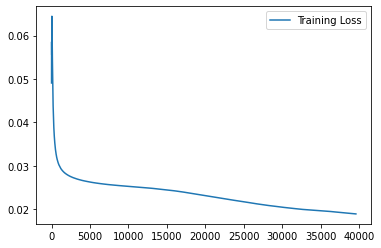

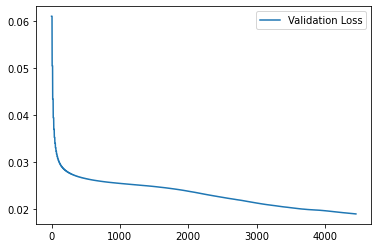

In [29]:
loss_Loss = []
loss_RCN = []
loss_KL = []
loss_val_L = []
loss_val_RCN = []
loss_val_KL = []

for i in range(len(loss)):
  #loss_Loss.append(float(loss[i]["loss"]))
  loss_RCN.append(float(loss[i]["reconstruction_loss"]))
for i in range(len(loss_val)):
  loss_val_RCN.append((loss_val[i]["reconstruction_loss"]))
'''  loss_KL.append(float(loss[i]["kl_loss"]))
'''
import pickle
from google.colab import files
n_plt = 'AE_SHM_Num_0F_03' 
fig_object = plt.figure()
plt.plot(loss_RCN,label ='Training Loss')
#plt.plot(loss_val_RCN,label ='Validation Loss')
plt.legend()
plt.savefig(n_plt+'1.pdf')
fig_object = plt.figure()
#plt.plot(loss_RCN,label ='Training Loss')
plt.plot(loss_val_RCN,label ='Validation Loss')
plt.legend()
plt.savefig(n_plt+'2.pdf')

#fig_object = plt.figure()
# Save to disk
pickle.dump(fig_object,open((n_plt+'.pickle'),'wb'))

ae_1_F_2.save_weights('./checkpoints/AE_SHM_Num_0F_03')

In [ ]:
ae_1_F_2.load_weights('./checkpoints/AE_SHM_Num_0F_02')

NameError: ignored

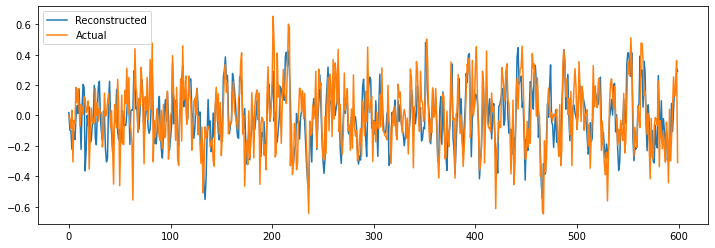

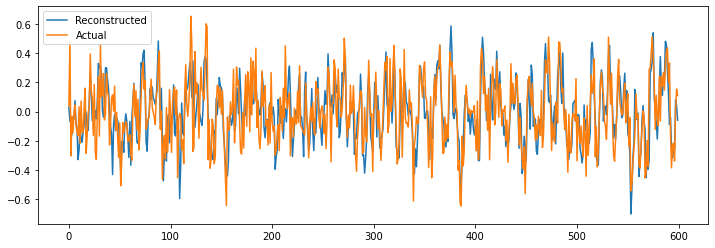

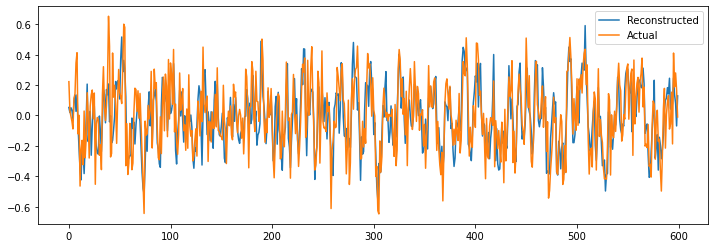

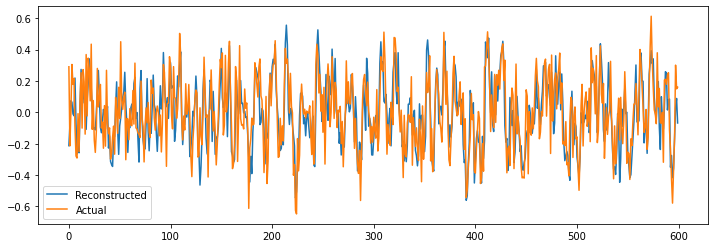

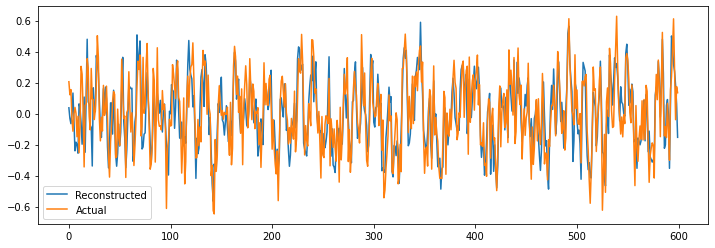

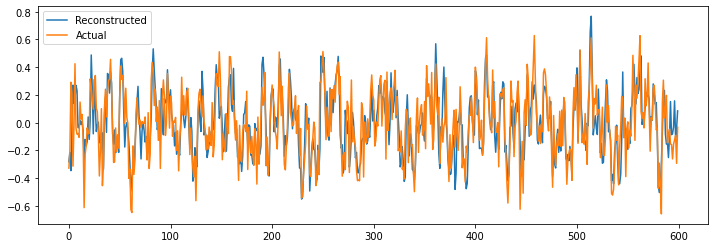

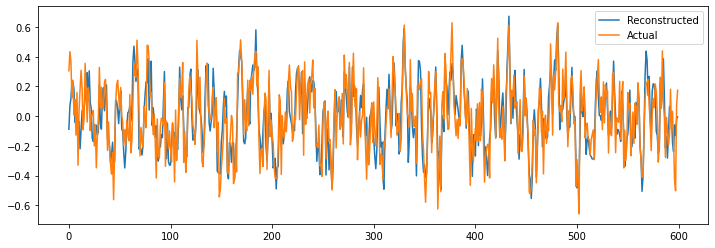

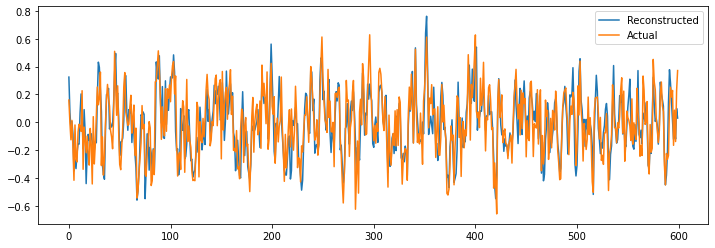

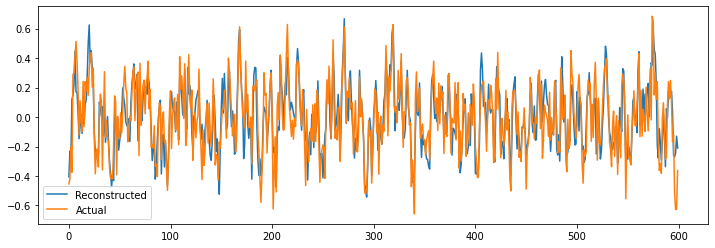

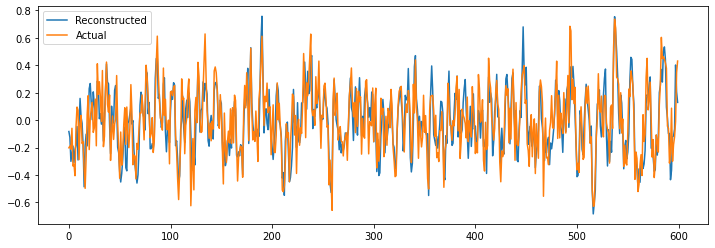

In [30]:
o3 = ae_1_F_2.encoder(asd)
out2 = ae_1_F_2.decoder(o3)
#print(tf.shape(out2))


for i in range(10):
    n_train = i+(80*i)#*120+5
    out2_np = out2.numpy()
    asd2_np = asd.numpy()
    plt.figure(figsize =(12,4))
    plt.plot(out2_np[n_train,:,:], label='Reconstructed')
    plt.plot(asd2_np[n_train,:,:], label='Actual')
    #print(out2_np[0,:,:].shape)
    plt.legend()


#Sensor 1 training

In [37]:
#U_b = U[0:10000,6]/np.max(U[0:10000,6]) #S101 Data
U = np.transpose(U)
U_b_1 = U[0:10000,1]/np.max(U[0:10000,1]) #Numerical building data

U_b = U_b_1


n_timesteps = 600
batch_size = 32

#for i in range(print(int((len(rossler)-n_timesteps)/n_timesteps))):
#    x_train = rossler[0:n_timesteps]
d_num = n_timesteps
hx = 1

#new_ = np.zeros([d_num,int(sample_size),sens_num])
dat = np.zeros([(int((len(U_b)-n_timesteps)/hx)),n_timesteps])
for i in range((int((len(U_b)-n_timesteps)/hx))):
      dat[i,:] = U_b[(hx*i):((hx*i)+d_num)]#/(np.max(np.abs(U[(hx*i):((hx*i)+d_num),1])))



#x_train = tf.data.Dataset.from_tensor_slices(dat[0:120,:].reshape(dat.shape[1],120,1))
dat1 = dat[0:int((dat.shape[0])*0.9),:] #train data
asd = tf.convert_to_tensor(
    dat1.reshape(dat1.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)

dat2 = dat[(int((dat.shape[0])*0.9)):(int((dat.shape[0]))),:] #test data
test2 = tf.convert_to_tensor(
    dat2.reshape(dat2.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)
#print(.shape)


datt = dat1

x_train = np.reshape(datt, (-1, n_timesteps,1))
train_dataset = tf.data.Dataset.from_tensor_slices((x_train))
train_dataset_1 = train_dataset.batch(120)


test = np.reshape(dat2, (-1, n_timesteps,1))
test_dataset = tf.data.Dataset.from_tensor_slices((test))
test_dataset_1 = test_dataset.batch(120)


In [38]:
ae_1_1_F_2 = VAE(encoder, decoder)
#vae = tensorflow.keras.models.Model(vae_input, vae_decoder_output, name="VAE")
#autoencoder = keras.Model(encoder_inputs, decoder_outputs)
ae_1_1_F_2.compile(optimizer=keras.optimizers.Adam(lr = 1e-3))

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [39]:
import time
loss = []
loss_val = []
epochs = 550
for epoch in range(epochs):
    print("\nStart of epoch %d" % (epoch,))
    start_time = time.time()

    # Iterate over the batches of the dataset.
    for step, (x_batch_train) in enumerate(train_dataset_1):
        loss_values = ae_1_1_F_2.train_step(x_batch_train)
        loss.append(loss_values)
        #print("loss {:1.2f}".format(loss.numpy()))
        # Log every 200 batches.
        if step % 10 == 0:
            print(
                "Training loss (for one batch) at step %d: %.4f recn "
                % (step, (float(loss_values["reconstruction_loss"]))))
            print("Seen so far: %d samples" % ((step + 1) * batch_size))
        if (epoch+1) % 50 == 0:
          ae_1_1_F_2.save_weights('./checkpoints/AE_trial_num_F_03_2'+str(epoch+1))          

    # Display metrics at the end of each epoch.
    #train_acc = train_acc_metric.result()
    #print("Training acc over epoch: %.4f" % (float(train_acc),))

    # Reset training metrics at the end of each epoch
    #train_acc_metric.reset_states()

    # Run a validation loop at the end of each epoch.
    for x_batch_val in (test_dataset_1):
        val_loss = ae_1_1_F_2.test_step(x_batch_val)
        loss_val.append(val_loss)
        print("loss {:1.2f}".format(float(val_loss["reconstruction_loss"])))

    #vae.save_weights


Görüntülenen çıkış son 5000 satıra kısaltıldı.
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02

Start of epoch 358
Training loss (for one batch) at step 0: 0.0230 recn 
Seen so far: 32 samples
Training loss (for one batch) at step 10: 0.0230 recn 
Seen so far: 352 samples
Training loss (for one batch) at step 20: 0.0230 recn 
Seen so far: 672 samples
Training loss (for one batch) at step 30: 0.0230 recn 
Seen so far: 992 samples
Training loss (for one batch) at step 40: 0.0230 recn 
Seen so far: 1312 samples
Training loss (for one batch) at step 50: 0.0230 recn 
Seen so far: 1632 samples
Training loss (for one batch) at step 60: 0.0230 recn 
Seen so far: 1952 samples
Training loss (for one batch) at step 70: 0.0230 recn 
Seen so far: 2272 samples
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02

Start of epoch 359
Training loss (for one batch) at step 0: 0.0230 recn 
Seen so far: 32 samples
Training loss (for one batch) at 

NameError: ignored

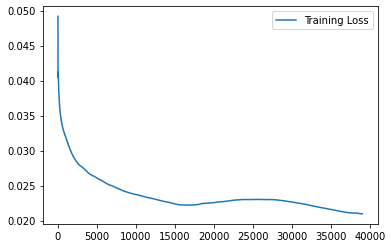

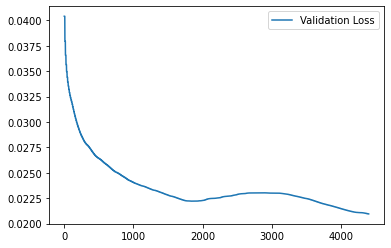

In [40]:
loss_Loss = []
loss_RCN = []
loss_KL = []
loss_val_L = []
loss_val_RCN = []
loss_val_KL = []

for i in range(len(loss)):
  #loss_Loss.append(float(loss[i]["loss"]))
  loss_RCN.append(float(loss[i]["reconstruction_loss"]))
for i in range(len(loss_val)):
  loss_val_RCN.append((loss_val[i]["reconstruction_loss"]))
'''  loss_KL.append(float(loss[i]["kl_loss"]))
'''
import pickle
from google.colab import files
n_plt = 'AE_SHM_Num_0F_03_2'
fig_object = plt.figure()
plt.plot(loss_RCN,label ='Training Loss')
#plt.plot(loss_val_RCN,label ='Validation Loss')
plt.legend()
plt.savefig(n_plt+'1.pdf')
fig_object = plt.figure()
#plt.plot(loss_RCN,label ='Training Loss')
plt.plot(loss_val_RCN,label ='Validation Loss')
plt.legend()
plt.savefig(n_plt+'2.pdf')

#fig_object = plt.figure()
# Save to disk
pickle.dump(fig_object,open((n_plt+'.pickle'),'wb'))

ae_1.save_weights('./checkpoints/AE_SHM_Num_0F_03_2_Last')

#Sensor 0 training

In [197]:
#U_b = U[0:10000,6]/np.max(U[0:10000,6]) #S101 Data
#U = np.transpose(U)
U_b_1 = U[0:10000,0]/np.max(U[0:10000,0]) #Numerical building data

U_b = U_b_1


n_timesteps = 600
batch_size = 32

#for i in range(print(int((len(rossler)-n_timesteps)/n_timesteps))):
#    x_train = rossler[0:n_timesteps]
d_num = n_timesteps
hx = 1

#new_ = np.zeros([d_num,int(sample_size),sens_num])
dat = np.zeros([(int((len(U_b)-n_timesteps)/hx)),n_timesteps])
for i in range((int((len(U_b)-n_timesteps)/hx))):
      dat[i,:] = U_b[(hx*i):((hx*i)+d_num)]#/(np.max(np.abs(U[(hx*i):((hx*i)+d_num),1])))



#x_train = tf.data.Dataset.from_tensor_slices(dat[0:120,:].reshape(dat.shape[1],120,1))
dat1 = dat[0:int((dat.shape[0])*0.9),:] #train data
asd = tf.convert_to_tensor(
    dat1.reshape(dat1.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)

dat2 = dat[(int((dat.shape[0])*0.9)):(int((dat.shape[0]))),:] #test data
test2 = tf.convert_to_tensor(
    dat2.reshape(dat2.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)
#print(.shape)

dat1.shape
datt = dat1

x_train = np.reshape(datt, (-1, n_timesteps,1))
train_dataset = tf.data.Dataset.from_tensor_slices((x_train))
train_dataset_2 = train_dataset.batch(120)


test = np.reshape(dat2, (-1, n_timesteps,1))
test_dataset = tf.data.Dataset.from_tensor_slices((test))
test_dataset_2 = test_dataset.batch(120)


In [198]:
ae_1_2_F_2 = VAE(encoder, decoder)
#vae = tensorflow.keras.models.Model(vae_input, vae_decoder_output, name="VAE")
#autoencoder = keras.Model(encoder_inputs, decoder_outputs)
ae_1_2_F_2.compile(optimizer=keras.optimizers.Adam(lr = 1e-3))

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [199]:
import time
loss = []
loss_val = []
epochs = 550
for epoch in range(epochs):
    print("\nStart of epoch %d" % (epoch,))
    start_time = time.time()

    # Iterate over the batches of the dataset.
    for step, (x_batch_train) in enumerate(train_dataset_2):
        loss_values = ae_1_2_F_2.train_step(x_batch_train)
        loss.append(loss_values)
        #print("loss {:1.2f}".format(loss.numpy()))
        # Log every 200 batches.
        if step % 10 == 0:
            print(
                "Training loss (for one batch) at step %d: %.4f recn "
                % (step, (float(loss_values["reconstruction_loss"]))))
            print("Seen so far: %d samples" % ((step + 1) * batch_size))
        if (epoch+1) % 50 == 0:
          ae_1_2_F_2.save_weights('./checkpoints/AE_SHM_Num_0F_03_3_L_'+str(epoch+1))          

    # Display metrics at the end of each epoch.
    #train_acc = train_acc_metric.result()
    #print("Training acc over epoch: %.4f" % (float(train_acc),))

    # Reset training metrics at the end of each epoch
    #train_acc_metric.reset_states()

    # Run a validation loop at the end of each epoch.
    for x_batch_val in (test_dataset_2):
        val_loss = ae_1_2_F_2.test_step(x_batch_val)
        loss_val.append(val_loss)
        print("loss {:1.2f}".format(float(val_loss["reconstruction_loss"])))

    #vae.save_weights


Görüntülenen çıkış son 5000 satıra kısaltıldı.
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02

Start of epoch 358
Training loss (for one batch) at step 0: 0.0180 recn 
Seen so far: 32 samples
Training loss (for one batch) at step 10: 0.0180 recn 
Seen so far: 352 samples
Training loss (for one batch) at step 20: 0.0180 recn 
Seen so far: 672 samples
Training loss (for one batch) at step 30: 0.0180 recn 
Seen so far: 992 samples
Training loss (for one batch) at step 40: 0.0180 recn 
Seen so far: 1312 samples
Training loss (for one batch) at step 50: 0.0180 recn 
Seen so far: 1632 samples
Training loss (for one batch) at step 60: 0.0180 recn 
Seen so far: 1952 samples
Training loss (for one batch) at step 70: 0.0180 recn 
Seen so far: 2272 samples
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02
loss 0.02

Start of epoch 359
Training loss (for one batch) at step 0: 0.0180 recn 
Seen so far: 32 samples
Training loss (for one batch) at 

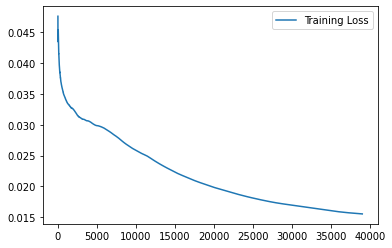

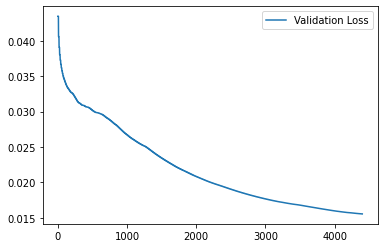

In [200]:
loss_Loss = []
loss_RCN = []
loss_KL = []
loss_val_L = []
loss_val_RCN = []
loss_val_KL = []

for i in range(len(loss)):
  #loss_Loss.append(float(loss[i]["loss"]))
  loss_RCN.append(float(loss[i]["reconstruction_loss"]))
for i in range(len(loss_val)):
  loss_val_RCN.append((loss_val[i]["reconstruction_loss"]))
'''  loss_KL.append(float(loss[i]["kl_loss"]))
'''
import pickle
from google.colab import files
n_plt = 'AE_SHM_Num_0F_03_3'
fig_object = plt.figure()
plt.plot(loss_RCN,label ='Training Loss')
#plt.plot(loss_val_RCN,label ='Validation Loss')
plt.legend()
plt.savefig(n_plt+'1.pdf')
fig_object = plt.figure()
#plt.plot(loss_RCN,label ='Training Loss')
plt.plot(loss_val_RCN,label ='Validation Loss')
plt.legend()
plt.savefig(n_plt+'2.pdf')

#fig_object = plt.figure()
# Save to disk
pickle.dump(fig_object,open((n_plt+'.pickle'),'wb'))

ae_1_2_F_2.save_weights('./checkpoints/AE_SHM_Num_0F_03_2_L_Last')

In [ ]:
#vae.save(filepath='my_model_01.h5')
#ae_1.load_weights("./checkpoints/AE_trial_03_4000")

In [ ]:
#train_dataset = tf.data.Dataset.from_tensor_slices((asd, asd))
#train_dataset = train_dataset.shuffle(buffer_size=1024).batch(batch_size)

In [ ]:
loss_Loss = []
loss_RCN = []
loss_KL = []
loss_val_L = []
loss_val_RCN = []
loss_val_KL = []

for i in range(len(loss)):
  #loss_Loss.append(float(loss[i]["loss"]))
  loss_RCN.append(float(loss[i]["reconstruction_loss"]))
'''  loss_KL.append(float(loss[i]["kl_loss"]))


for i in range(len(loss_val)):
  loss_val.append((loss_val[i]["reconstruction_loss"]))
  #loss_val_L.append(float(loss_val[i]["loss"]))
  loss_val_RCN.append(float(loss_val[i]["reconstruction_loss"]))
  loss_val_KL.append(float(loss_val[i]["kl_loss"]))
TR_L = np.array(loss_Loss).reshape(len(loss_Loss),1)
TR_RL = np.array(loss_RCN).reshape(len(loss_RCN),1) 
TR_KL = np.array(loss_KL).reshape(len(loss_KL),1) 

Loss_train1 = np.concatenate((TR_L,TR_RL,TR_KL), axis=1)  
T_loss_dataframe = pd.DataFrame(Loss_train1, columns=["Loss", "RCN", "KL"])

V_TR_L = np.array(loss_val_L).reshape(len(loss_val_L),1)
V_TR_RL = np.array(loss_val_RCN).reshape(len(loss_val_RCN),1) 
V_TR_KL = np.array(loss_val_KL).reshape(len(loss_val_KL),1) 

Loss_val1 = np.concatenate((V_TR_L,V_TR_RL,V_TR_KL), axis=1)  
V_loss_dataframe = pd.DataFrame(Loss_val1, columns=["Loss", "RCN", "KL"])

T_loss_dataframe.to_csv('TLoss.csv')
V_loss_dataframe.to_csv('VLoss.csv')
'''

'  loss_KL.append(float(loss[i]["kl_loss"]))\n\n\nfor i in range(len(loss_val)):\n  loss_val.append((loss_val[i]["reconstruction_loss"]))\n  #loss_val_L.append(float(loss_val[i]["loss"]))\n  loss_val_RCN.append(float(loss_val[i]["reconstruction_loss"]))\n  loss_val_KL.append(float(loss_val[i]["kl_loss"]))\nTR_L = np.array(loss_Loss).reshape(len(loss_Loss),1)\nTR_RL = np.array(loss_RCN).reshape(len(loss_RCN),1) \nTR_KL = np.array(loss_KL).reshape(len(loss_KL),1) \n\nLoss_train1 = np.concatenate((TR_L,TR_RL,TR_KL), axis=1)  \nT_loss_dataframe = pd.DataFrame(Loss_train1, columns=["Loss", "RCN", "KL"])\n\nV_TR_L = np.array(loss_val_L).reshape(len(loss_val_L),1)\nV_TR_RL = np.array(loss_val_RCN).reshape(len(loss_val_RCN),1) \nV_TR_KL = np.array(loss_val_KL).reshape(len(loss_val_KL),1) \n\nLoss_val1 = np.concatenate((V_TR_L,V_TR_RL,V_TR_KL), axis=1)  \nV_loss_dataframe = pd.DataFrame(Loss_val1, columns=["Loss", "RCN", "KL"])\n\nT_loss_dataframe.to_csv(\'TLoss.csv\')\nV_loss_dataframe.to_csv(

Saving the graph to drive using pickle and downloading it.

In [ ]:
asd1 = tf.convert_to_tensor(
    dat[0:240,:].reshape(240,120,1), dtype=None, dtype_hint=None, name=None
)


test = np.reshape(dat_test, (-1, 120,1))
test_dataset = tf.data.Dataset.from_tensor_slices((test))
test_dataset = test_dataset.batch(120)
#print(test_dataset)

o3 = ae_1.encoder(asd1)
out2 = ae_1.decoder(o3)
#print(tf.shape(out2))

n_train = 2
out2_np = out2.numpy()
asd2_np = asd1.numpy()
plt.plot(out2_np[n_train,:,:], label='predicted')
plt.plot(asd2_np[n_train,:,:], label='Actual')
#print(out2_np[0,:,:].shape)
plt.legend()




At = ae_1.predict(train_X[2240:40000,:,:])
i = 120
a = 0
for i in range(10):
  
  plt.figure()
  plt.plot(test_X[a,:,:])
  plt.plot(At[a,:,:])
  a = a+1280


In [ ]:
print(test.shape)

(99, 120, 1)


In [ ]:
val_loss_tests = ae_1.test_step(test2)

In [ ]:
print(len(val_loss_tests)

AttributeError: ignored

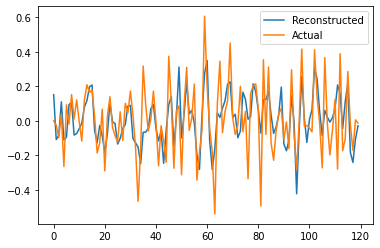

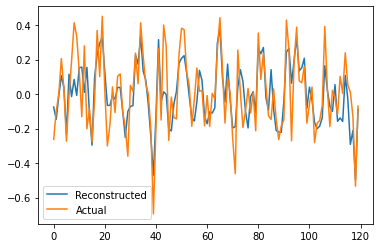

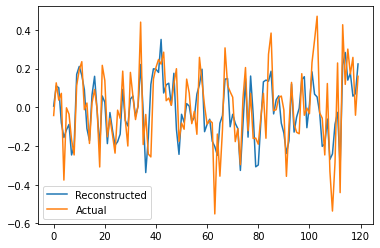

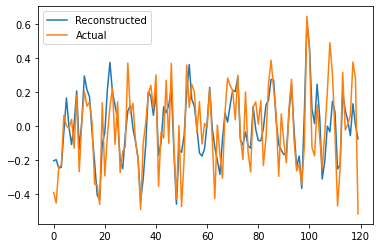

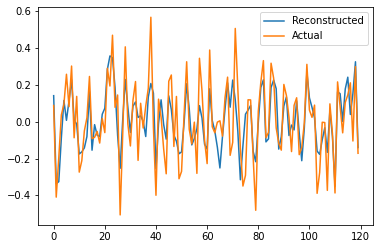

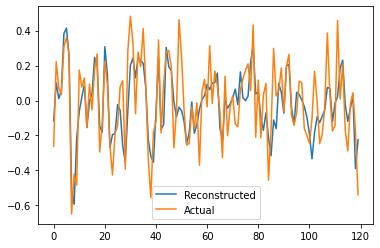

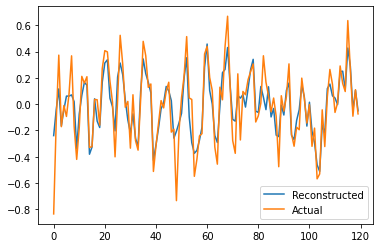

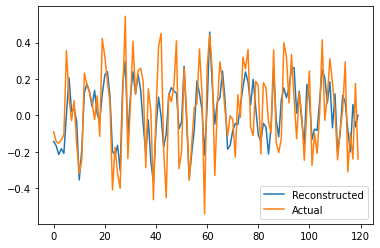

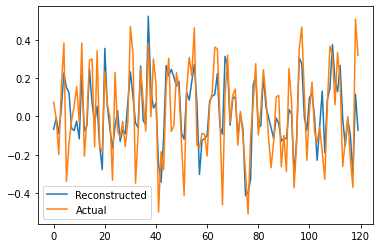

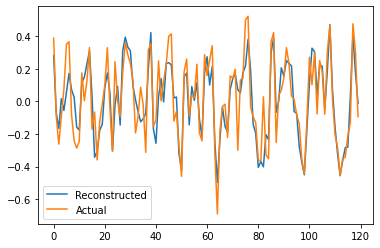

In [ ]:

o3 = ae_1_2.encoder(asd)
out2 = ae_1_2.decoder(o3)
#print(tf.shape(out2))


for i in range(10):
    n_train = i+(80*i)#*120+5
    out2_np = out2.numpy()
    asd2_np = asd.numpy()
    plt.figure()
    plt.plot(out2_np[n_train,:,:], label='Reconstructed')
    plt.plot(asd2_np[n_train,:,:], label='Actual')
    #print(out2_np[0,:,:].shape)
    plt.legend()


In [ ]:

dat2 = dat[(int((dat.shape[0])*0.9)):(int((dat.shape[0]))),:] #test data
test2 = tf.convert_to_tensor(
    dat2.reshape(dat2.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)

In [ ]:
print(dat2.shape)

(99, 120)


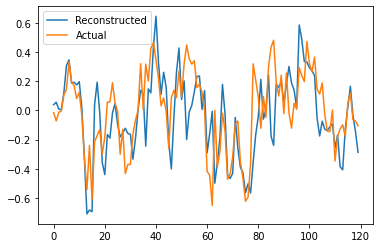

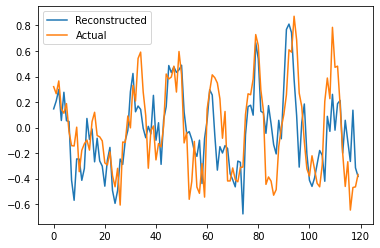

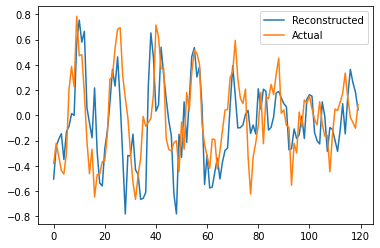

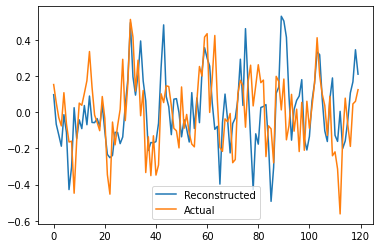

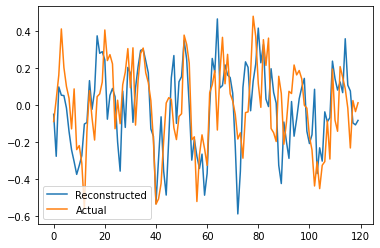

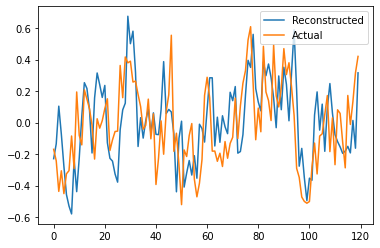

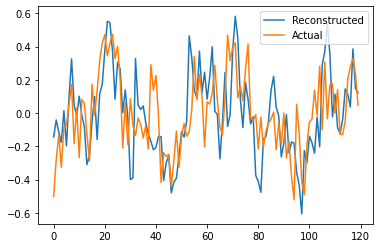

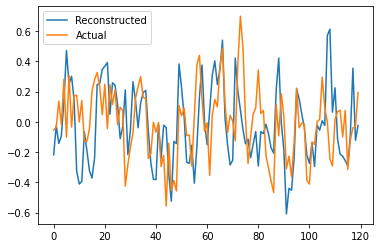

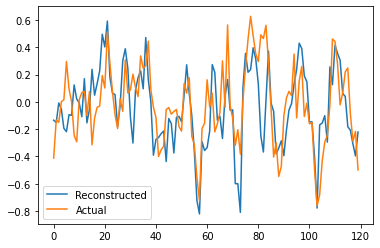

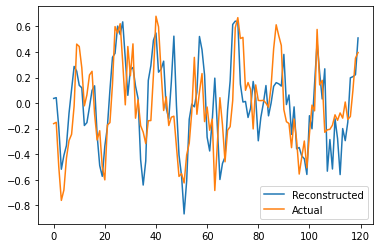

In [ ]:

o3_t = ae_1.encoder(test2)
out_test = ae_1.decoder(o3_t)
#print(tf.shape(out2))

for i in range(10):
    n_train = (10*i)#*120+5
    out_t_np = out_test.numpy()
    test_np = test2.numpy()
    plt.figure()
    plt.plot(out_t_np[n_train,:,:], label='Reconstructed')
    plt.plot(test_np[n_train,:,:], label='Actual')
    #print(out2_np[0,:,:].shape)
    plt.legend()

In [ ]:
n_train =500
out2_np = out2.numpy()
asd2_np = asd.numpy()
plt.figure()
plt.plot(out2_np[n_train,:,:], label='predicted')
plt.plot(asd2_np[n_train,:,:], label='Actual')
#print(out2_np[0,:,:].shape)
plt.legend()

In [ ]:
print(asd.shape)

(8892, 120, 1)


#Sensor 3 training


In [8]:
#U_b = U[0:10000,6]/np.max(U[0:10000,6]) #S101 Data

U_b_3 = U[0:10000,3]/np.max(U[0:10000,3]) #Numerical building data

U_b = U_b_3


n_timesteps = 600
batch_size = 32

#for i in range(print(int((len(rossler)-n_timesteps)/n_timesteps))):
#    x_train = rossler[0:n_timesteps]
d_num = n_timesteps
hx = 1

#new_ = np.zeros([d_num,int(sample_size),sens_num])
dat = np.zeros([(int((len(U_b)-n_timesteps)/hx)),n_timesteps])
for i in range((int((len(U_b)-n_timesteps)/hx))):
      dat[i,:] = U_b[(hx*i):((hx*i)+d_num)]#/(np.max(np.abs(U[(hx*i):((hx*i)+d_num),1])))



#x_train = tf.data.Dataset.from_tensor_slices(dat[0:120,:].reshape(dat.shape[1],120,1))
dat1 = dat[0:int((dat.shape[0])*0.9),:] #train data
asd = tf.convert_to_tensor(
    dat1.reshape(dat1.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)

dat2 = dat[(int((dat.shape[0])*0.9)):(int((dat.shape[0]))),:] #test data
test2 = tf.convert_to_tensor(
    dat2.reshape(dat2.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)
#print(.shape)

dat1.shape
datt = dat1

x_train = np.reshape(datt, (-1, n_timesteps,1))
train_dataset = tf.data.Dataset.from_tensor_slices((x_train))
train_dataset_4 = train_dataset.batch(120)


test = np.reshape(dat2, (-1, n_timesteps,1))
test_dataset = tf.data.Dataset.from_tensor_slices((test))
test_dataset_4 = test_dataset.batch(120)



In [11]:
ae_4_F_2 = VAE(encoder, decoder)
#vae = tensorflow.keras.models.Model(vae_input, vae_decoder_output, name="VAE")
#autoencoder = keras.Model(encoder_inputs, decoder_outputs)
ae_4_F_2.compile(optimizer=keras.optimizers.Adam(lr = 1e-3))

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [12]:
import time
loss = []
loss_val = []
epochs = 550                                                                                                                                                                                                                                          
for epoch in range(epochs):
    print("\nStart of epoch %d" % (epoch,))
    start_time = time.time()

    # Iterate over the batches of the dataset.
    for step, (x_batch_train) in enumerate(train_dataset_4):
        loss_values = ae_4_F_2.train_step(x_batch_train)
        loss.append(loss_values)
        #print("loss {:1.2f}".format(loss.numpy()))
        # Log every 200 batches.
        if step % 10 == 0:
            print(
                "Training loss (for one batch) at step %d: %.4f recn "
                % (step, (float(loss_values["reconstruction_loss"]))))
            print("Seen so far: %d samples" % ((step + 1) * batch_size))
        if (epoch+1) % 500 == 0:
          ae_4_F_2.save_weights('./checkpoints/AE_trial_num_F02_4_'+str(epoch+1))          

    # Display metrics at the end of each epoch.
    #train_acc = train_acc_metric.result()
    #print("Training acc over epoch: %.4f" % (float(train_acc),))

    # Reset training metrics at the end of each epoch
    #train_acc_metric.reset_states()

    # Run a validation loop at the end of each epoch.
    for x_batch_val in (test_dataset_4):
        val_loss = ae_4_F_2.test_step(x_batch_val)
        loss_val.append(val_loss)
        print("loss {:1.2f}".format(float(val_loss["reconstruction_loss"])))

    #vae.save_weights


Görüntülenen çıkış son 5000 satıra kısaltıldı.
loss 0.03
loss 0.03
loss 0.03
loss 0.03
loss 0.03
loss 0.03
loss 0.03

Start of epoch 358
Training loss (for one batch) at step 0: 0.0259 recn 
Seen so far: 32 samples
Training loss (for one batch) at step 10: 0.0259 recn 
Seen so far: 352 samples
Training loss (for one batch) at step 20: 0.0259 recn 
Seen so far: 672 samples
Training loss (for one batch) at step 30: 0.0259 recn 
Seen so far: 992 samples
Training loss (for one batch) at step 40: 0.0259 recn 
Seen so far: 1312 samples
Training loss (for one batch) at step 50: 0.0259 recn 
Seen so far: 1632 samples
Training loss (for one batch) at step 60: 0.0259 recn 
Seen so far: 1952 samples
Training loss (for one batch) at step 70: 0.0259 recn 
Seen so far: 2272 samples
loss 0.03
loss 0.03
loss 0.03
loss 0.03
loss 0.03
loss 0.03
loss 0.03
loss 0.03

Start of epoch 359
Training loss (for one batch) at step 0: 0.0259 recn 
Seen so far: 32 samples
Training loss (for one batch) at step 10: 0

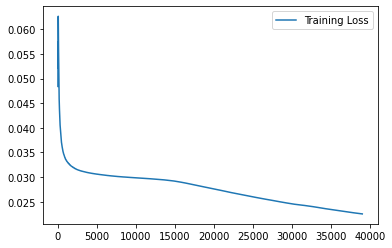

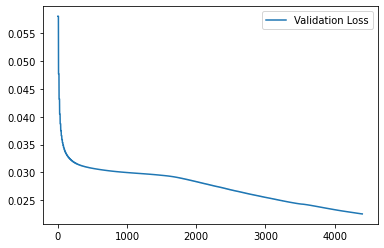

In [13]:
loss_Loss = []
loss_RCN = []
loss_KL = []
loss_val_L = []
loss_val_RCN = []
loss_val_KL = []

for i in range(len(loss)):
  #loss_Loss.append(float(loss[i]["loss"]))
  loss_RCN.append(float(loss[i]["reconstruction_loss"]))
for i in range(len(loss_val)):
  loss_val_RCN.append((loss_val[i]["reconstruction_loss"]))
'''  loss_KL.append(float(loss[i]["kl_loss"]))
'''
import pickle
from google.colab import files
n_plt = 'AE_trial_num_F02_4_'
fig_object = plt.figure()
plt.plot(loss_RCN,label ='Training Loss')
#plt.plot(loss_val_RCN,label ='Validation Loss')
plt.legend()
plt.savefig(n_plt+'1.pdf')
fig_object = plt.figure()
#plt.plot(loss_RCN,label ='Training Loss')
plt.plot(loss_val_RCN,label ='Validation Loss')
plt.legend()
plt.savefig(n_plt+'2.pdf')

#fig_object = plt.figure()
# Save to disk
pickle.dump(fig_object,open((n_plt+'.pickle'),'wb'))

ae_4_F_2.save_weights('./checkpoints/AE_trial_num_F02_4_Last')

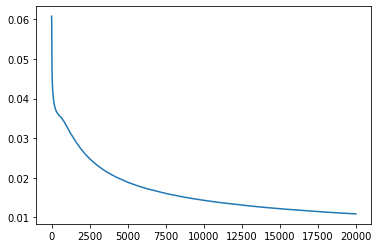

In [ ]:
plt.plot(loss_val_RCN,label ='Validation Loss')

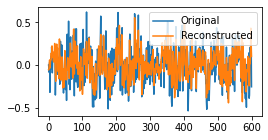

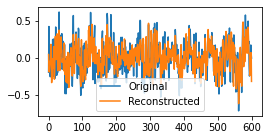

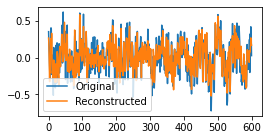

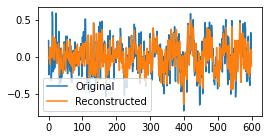

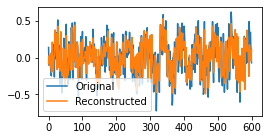

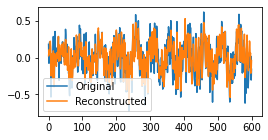

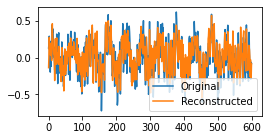

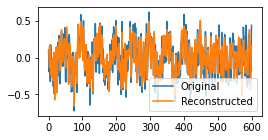

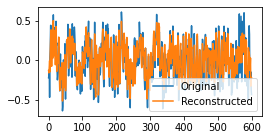

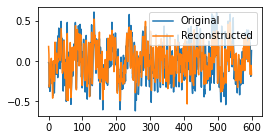

In [15]:
o3 = ae_4_F_2.encoder(asd)
out2 = ae_4_F_2.decoder(o3)
#print(tf.shape(out2))

#fig, ax = plt.subplots(2, 5, sharex='col', sharey='row', figsize = (6,15), dpi = 140)
plt_name = 'trial_'
for i in range(10):
    n_train = i+(80*i)#*120+5
    out2_np = out2.numpy()
    asd2_np = asd.numpy()
    plt.figure(figsize = (4,2))
    plt.plot(asd2_np[n_train,:,:], label='Original')
    plt.plot(out2_np[n_train,:,:], label='Reconstructed')

    #print(out2_np[0,:,:].shape)
    plt.legend()
    plt.savefig(plt_name+str(i)+'.pdf')
    pickle.dump(fig_object,open((plt_name+str(i)+'.pickle'),'wb'))


#Sensor 4 Training

In [117]:
#U_b = U[0:10000,6]/np.max(U[0:10000,6]) #S101 Data

U_b_3 = U[0:10000,4]/np.max(U[0:10000,4]) #Numerical building data

U_b = U_b_3


n_timesteps = 600
batch_size = 32

#for i in range(print(int((len(rossler)-n_timesteps)/n_timesteps))):
#    x_train = rossler[0:n_timesteps]
d_num = n_timesteps
hx = 10

#new_ = np.zeros([d_num,int(sample_size),sens_num])
dat = np.zeros([(int((len(U_b)-n_timesteps)/hx)),n_timesteps])
for i in range((int((len(U_b)-n_timesteps)/hx))):
      dat[i,:] = U_b[(hx*i):((hx*i)+d_num)]#/(np.max(np.abs(U[(hx*i):((hx*i)+d_num),1])))



#x_train = tf.data.Dataset.from_tensor_slices(dat[0:120,:].reshape(dat.shape[1],120,1))
dat1 = dat[0:int((dat.shape[0])*0.9),:] #train data
asd = tf.convert_to_tensor(
    dat1.reshape(dat1.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)

dat2 = dat[(int((dat.shape[0])*0.9)):(int((dat.shape[0]))),:] #test data
test2 = tf.convert_to_tensor(
    dat2.reshape(dat2.shape[0],n_timesteps,1), dtype=None, dtype_hint=None, name=None
)
#print(.shape)

dat1.shape
datt = dat1

x_train = np.reshape(datt, (-1, n_timesteps,1))
train_dataset = tf.data.Dataset.from_tensor_slices((x_train))
train_dataset_5 = train_dataset.batch(120)


test = np.reshape(dat2, (-1, n_timesteps,1))
test_dataset = tf.data.Dataset.from_tensor_slices((test))
test_dataset_5 = test_dataset.batch(120)



In [131]:
#U_b = U[0:10000,6]/np.max(U[0:10000,6]) #S101 Data

U_b_3_test = U[10000:20000,4]/np.max(U[10000:20000,4]) #Numerical building data

U_b = U_b_3_test


n_timesteps = 600
batch_size = 32

#for i in range(print(int((len(rossler)-n_timesteps)/n_timesteps))):
#    x_train = rossler[0:n_timesteps]
d_num = n_timesteps
hx = 10

#new_ = np.zeros([d_num,int(sample_size),sens_num])
dat = np.zeros([(int((len(U_b)-n_timesteps)/hx)),n_timesteps])
for i in range((int((len(U_b)-n_timesteps)/hx))):
      dat[i,:] = U_b[(hx*i):((hx*i)+d_num)]#/(np.max(np.abs(U[(hx*i):((hx*i)+d_num),1])))



#x_train = tf.data.Dataset.from_tensor_slices(dat[0:120,:].reshape(dat.shape[1],120,1))
dat1 = dat[0:int((dat.shape[0])*0.9),:] #train data
dat2 = dat[0:int((dat.shape[0])*0.9),:] #test data


test = np.reshape(dat2, (-1, n_timesteps,1))
test_dataset = tf.data.Dataset.from_tensor_slices((test))
test_dataset_5 = test_dataset.batch(120)


In [20]:


ae_5_F2 = VAE(encoder, decoder)
#vae = tensorflow.keras.models.Model(vae_input, vae_decoder_output, name="VAE")
#autoencoder = keras.Model(encoder_inputs, decoder_outputs)
ae_5_F2.compile(optimizer=keras.optimizers.Adam(lr = 1e-3))

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [21]:
import time
loss = []
loss_val = []
epochs = 550
for epoch in range(epochs):
    print("\nStart of epoch %d" % (epoch,))
    start_time = time.time()

    # Iterate over the batches of the dataset.
    for step, (x_batch_train) in enumerate(train_dataset_5):
        loss_values = ae_5_F2.train_step(x_batch_train)
        loss.append(loss_values)
        #print("loss {:1.2f}".format(loss.numpy()))
        # Log every 200 batches.
        if step % 10 == 0:
            print(
                "Training loss (for one batch) at step %d: %.4f recn "
                % (step, (float(loss_values["reconstruction_loss"]))))
            print("Seen so far: %d samples" % ((step + 1) * batch_size))
        if (epoch+1) % 50 == 0:
          ae_5_F2.save_weights('./checkpoints/AE_trial_num_03_F2_5_'+str(epoch+1))          

    # Display metrics at the end of each epoch.
    #train_acc = train_acc_metric.result()
    #print("Training acc over epoch: %.4f" % (float(train_acc),))

    # Reset training metrics at the end of each epoch
    #train_acc_metric.reset_states()

    # Run a validation loop at the end of each epoch.
    for x_batch_val in (test_dataset_5):
        val_loss = ae_5_F2.test_step(x_batch_val)
        loss_val.append(val_loss)
        print("loss {:1.2f}".format(float(val_loss["reconstruction_loss"])))

    #vae.save_weights



Start of epoch 0
Training loss (for one batch) at step 0: 0.0535 recn 
Seen so far: 32 samples
loss 0.06

Start of epoch 1
Training loss (for one batch) at step 0: 0.0563 recn 
Seen so far: 32 samples
loss 0.05

Start of epoch 2
Training loss (for one batch) at step 0: 0.0526 recn 
Seen so far: 32 samples
loss 0.05

Start of epoch 3
Training loss (for one batch) at step 0: 0.0500 recn 
Seen so far: 32 samples
loss 0.05

Start of epoch 4
Training loss (for one batch) at step 0: 0.0478 recn 
Seen so far: 32 samples
loss 0.05

Start of epoch 5
Training loss (for one batch) at step 0: 0.0460 recn 
Seen so far: 32 samples
loss 0.04

Start of epoch 6
Training loss (for one batch) at step 0: 0.0446 recn 
Seen so far: 32 samples
loss 0.04

Start of epoch 7
Training loss (for one batch) at step 0: 0.0433 recn 
Seen so far: 32 samples
loss 0.04

Start of epoch 8
Training loss (for one batch) at step 0: 0.0422 recn 
Seen so far: 32 samples
loss 0.04

Start of epoch 9
Training loss (for one batch

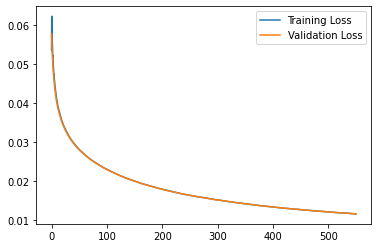

In [25]:
loss_Loss = []
loss_RCN = []
loss_KL = []
loss_val_L = []
loss_val_RCN = []
loss_val_KL = []

for i in range(len(loss)):
  #loss_Loss.append(float(loss[i]["loss"]))
  loss_RCN.append(float(loss[i]["reconstruction_loss"]))
for i in range(len(loss_val)):
  loss_val_RCN.append((loss_val[i]["reconstruction_loss"]))
'''  loss_KL.append(float(loss[i]["kl_loss"]))
'''
import pickle
from google.colab import files
n_plt = 'AE_trial_num_03_F2_5_'

fig_object = plt.figure()
plt.plot(np.linspace(0,550,len(loss_RCN)),loss_RCN,label ='Training Loss')
#plt.plot(loss_val_RCN,label ='Validation Loss')
plt.legend()
#plt.savefig(n_plt+'1.pdf')
#fig_object = plt.figure()
#plt.plot(loss_RCN,label ='Training Loss')
plt.plot(np.linspace(0,550,len(loss_val_RCN)),loss_val_RCN,label ='Validation Loss')
plt.legend()
plt.savefig(n_plt+'2.pdf')
plt.legend()
plt.savefig(n_plt+'3.pdf')

#fig_object = plt.figure()
# Save to disk
pickle.dump(fig_object,open((n_plt+'.pickle'),'wb'))

ae_5_F2.save_weights('./checkpoints/AE_trial_num_03_F2_5_Last')

In [132]:
test.shape

(846, 600, 1)

0.05088294669985771
0.053618788719177246
0.055292725563049316
0.05137672275304794
0.05313156545162201
0.05492839962244034
0.04905632138252258
0.05166468769311905
0.057934392243623734
0.048305694013834
0.05503835156559944
0.06141858920454979
0.05518381670117378
0.05521559342741966
0.05935855954885483
0.05615062639117241
0.05430688336491585
0.059957098215818405
0.05848270282149315
0.05546323210000992


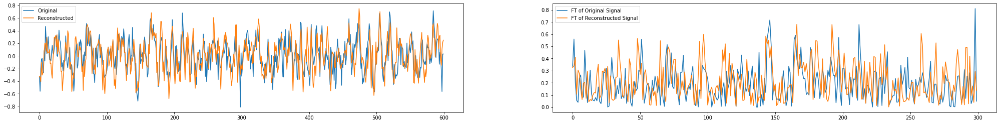

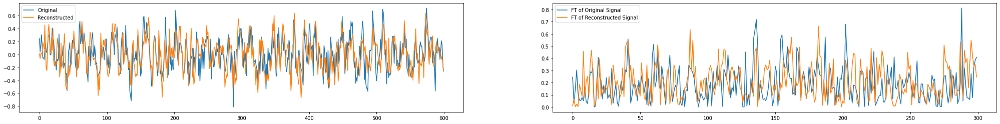

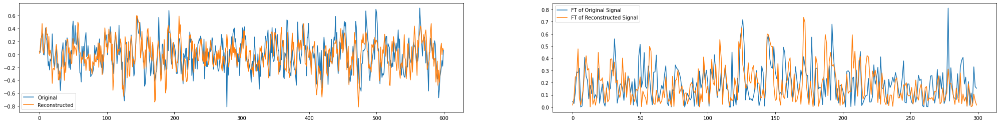

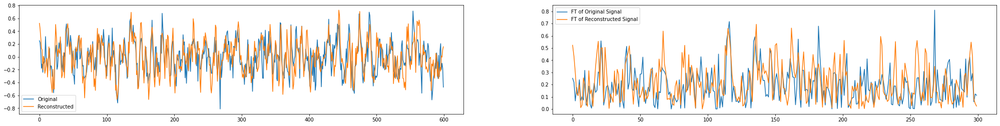

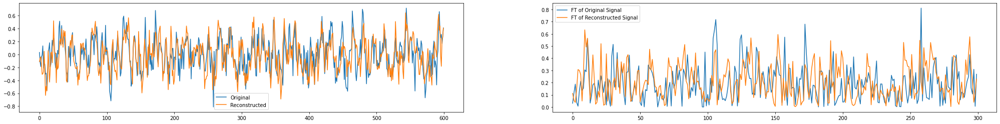

...

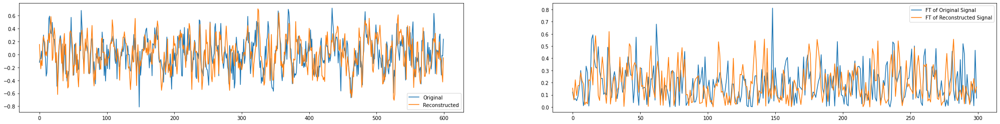

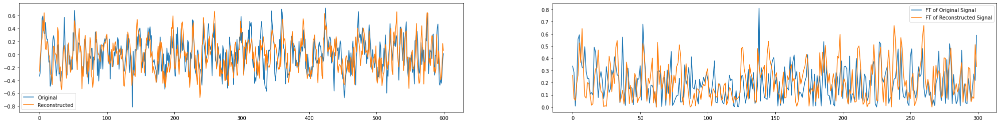

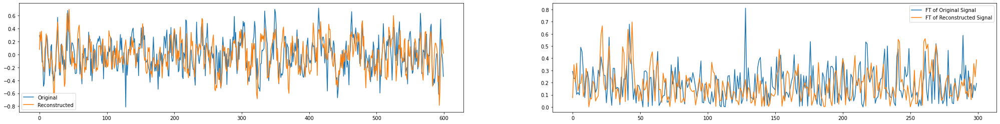

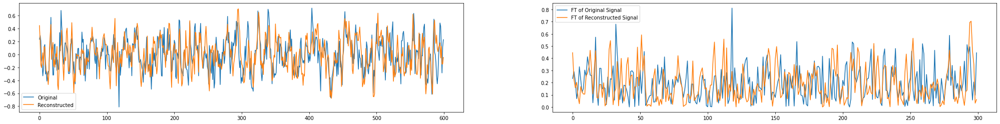

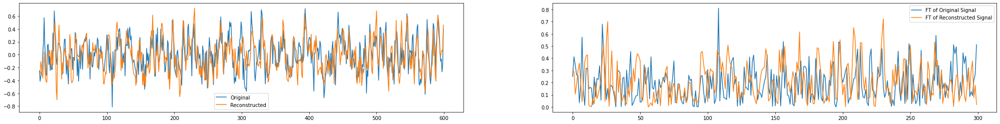

In [142]:


o3 = ae_5_F2.encoder(test)
out2 = ae_5_F2.decoder(o3)
#print(tf.shape(out2))
asd_S0_1 = test
out2_np2 = out2.numpy()

#fig, ax = plt.subplots(2, 5, sharex='col', sharey='row', figsize = (6,15), dpi = 140)
plt_name = 'trial_5_w_FFT'
'''
for i in range(10):
    n_train = i+(80*i)#*120+5
    out2_np = out2.numpy()
    asd2_np = asd.numpy()
    plt.figure(figsize = (10,3))
    plt.plot(asd2_np[n_train,:,:], label='Original')
    plt.plot(out2_np[n_train,:,:], label='Reconstructed')

    #print(out2_np[0,:,:].shape)
    plt.legend()
    plt.savefig(plt_name+str(i)+'.pdf')
    pickle.dump(fig_object,open((plt_name+str(i)+'.pickle'),'wb'))'''


j = 4
for i in range(20):
    #plt.figure(figsize = [25,4])
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))
    n_train = i+(0*i)#*120+5
    #out2_np = out2.numpy()
    #asd2_np = asd.numpy()
    #plt.figure(figsize = (35,4))
    ax1.plot(asd_S0_1[n_train,:], label='Original')
    ax1.plot(out2_np2[n_train,:], label='Reconstructed')
    ax1.legend()
    asd_np = asd_S0_1[n_train,:]
    asd_fft = (np.abs(np.fft.fftshift(np.fft.fft((asd_np)))))
    out_np = out2_np2[n_train,:]
    out_fft = (np.abs(np.fft.fftshift(np.fft.fft((out_np)))))
    print(str(float(mse(asd_np, out_np))))
    ax2.plot(asd_fft[int(asd_fft.shape[0]/2):(asd_fft.shape[0])], label='FT of Original Signal')
    ax2.plot(out_fft[int(out_fft.shape[0]/2):(out_fft.shape[0])], label='FT of Reconstructed Signal')
    #ax2.plot(np.fft.fft(asd_np), label='Original')
    #print(out2_np[0,:,:].shape)
    ax2.legend()
    plt.savefig(plt_name+str(i)+'.pdf')
    #pickle.dump(fig_object,open((plt_name+str(i)+'.pickle'),'wb'))

Loss_tr = np.zeros([1000,1])
for i in range(800):
    #plt.figure(figsize = [25,4])
    #fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))
    n_train = i+(0*i)#*120+5
    #out2_np = out2.numpy()
    #asd2_np = asd.numpy()
    #plt.figure(figsize = (35,4))
    asd_np = asd_S0_1[n_train,:]
    out_np = out2_np2[n_train,:]
    Loss_tr[i,]=((float(mse(asd_np, out_np))))

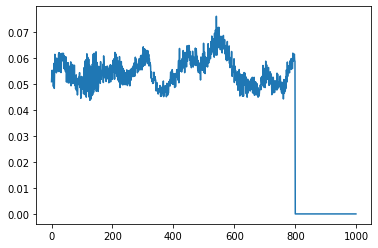

In [143]:

plt.plot(Loss_tr)

In [229]:
'''dat1_test = np.reshape(dat1[:,:,4],(dat1.shape[0],dat1.shape[1],1))
o3_w = ae_5_F2.encoder(dat1_test)
out2_w = ae_5_F2.decoder(o3_w)
#print(tf.shape(out2))
asd_S0_w = dat1_test
out2_np2 = out2_w.numpy()
'''

Loss_tr = np.zeros([dat1.shape[0],5])
for j in range(5):
    #j = 4
    for i in range(dat1.shape[0]):
        #plt.figure(figsize = [25,4])
        #fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))
        n_train = i+(0*i)#*120+5
        #out2_np = out2.numpy()
        #asd2_np = asd.numpy()
        #plt.figure(figsize = (35,4))
        #asd_np = asd_S0_w[n_train,:]
        asd_np = np.reshape(dat1[i,:,j],(1,dat1.shape[1],1))
        #out_np = out2_np2[n_train,:]
        out_np_tr = out_0np[i,:,:,j]
        Loss_tr[i,j]=((float(mse(asd_np, out_np_tr))))

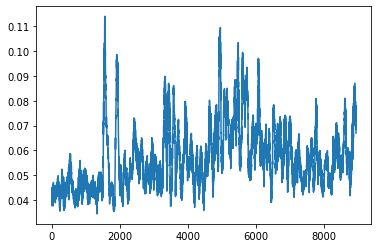

In [231]:
plt.plot(Loss_tr[:,1])

IndexError: ignored

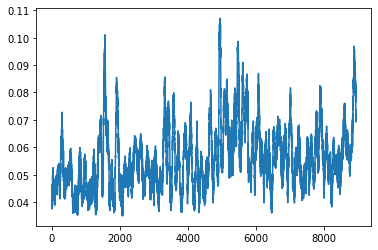

In [221]:
plt.plot(Loss_tr1)
plt.plot(plt.plot(Loss_tr[:,4]))

In [224]:
dat1.shape

(8940, 600, 5)

#Loading all model

In [14]:
ae_5_F2.load_weights('./checkpoints/AE_trial_num_03_F2_5_Last')

In [ ]:
len(A[0,:])

15000

In [152]:
U_tran = np.transpose(U)
print(U.shape)
print(UA_E.shape)

(75000, 5)
(90000, 5)


In [151]:
from Damage_Scenarios_ import *
UA_E = np.zeros([90000,5])
for i in range(5):
    #AB[:,i] = np.append(A[i,:],B[i,:],0)
    #CD[:,i] = np.append(C[i,:],D[i,:],0)
    #A_D[:,i] = np.append(np.append(A[i,:],B[i,:],0),np.append(C[i,:],D[i,:],0),0)
    #A_E[:,i] = np.append(np.append(np.append(A[i,:],B[i,:],0),np.append(C[i,:],D[i,:],0),0),E[i,:],0)
#i = 0
    UA_E[:,i] = np.append(np.transpose(U[10000:25000,i]),np.append(np.append(np.append(A[i,:],B[i,:],0),np.append(C[i,:],D[i,:],0),0),E[i,:],0),0)


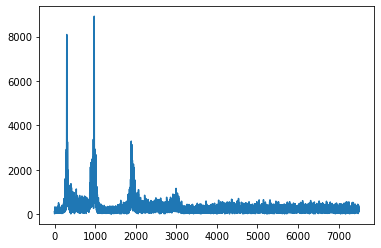

In [114]:
out_np = out_0np[n_train,:,:,j]
U_F = U[10000:25000,4]
U_fft = (np.abs(np.fft.fftshift(np.fft.fft((U_F)))))
plt.plot(U_fft[int(U_fft.shape[0]/2):(U_fft.shape[0])], label='FT of Original Signal')



In [206]:
U_b = np.zeros([90000,5])
n_timesteps = 600
batch_size = 32

#for i in range(print(int((len(rossler)-n_timesteps)/n_timesteps))):
#    x_train = rossler[0:n_timesteps]
d_num = n_timesteps
hx = 10

#new_ = np.zeros([d_num,int(sample_size),sens_num])
dat_S0 = np.zeros([(int((len(U_b)-n_timesteps)/hx)),n_timesteps,5])
for j in range(5):
    U_b[:,j] = UA_E[:,j]/np.max(np.abs(UA_E[:,j]))

    for i in range((int((len(U_b)-n_timesteps)/hx))):
        dat_S0[i,:,j] = U_b[(hx*i):((hx*i)+d_num),j]#/(np.max(np.abs(U[(hx*i):((hx*i)+d_num),1])))



    #x_train = tf.data.Dataset.from_tensor_slices(dat[0:120,:].reshape(dat.shape[1],120,1))
dat1 = dat_S0[0:int((dat_S0.shape[0])*1),:,:] #train data
asd_S0 = tf.convert_to_tensor(
    dat1.reshape(dat1.shape[0],n_timesteps,5), dtype=None, dtype_hint=None, name=None
)


In [53]:
tf.reshape(asd_S0[:,:,0],[asd_S0.shape[0],asd_S0.shape[1],1]).shape

TensorShape([8046, 600, 1])

In [207]:
print(dat1.shape)

(8940, 600, 5)


In [202]:
ae_1_F_2 = VAE(encoder, decoder)
ae_1_1_F_2 = VAE(encoder, decoder)
ae_1_2_F_2 = VAE(encoder, decoder)
ae_4_F_2 = VAE(encoder, decoder)
ae_5_F_2 = VAE(encoder, decoder)

In [202]:
ae_1_F_2.load_weights('./checkpoints/AE_trial_num_F_03_550')
ae_1_1_F_2.load_weights('./checkpoints/AE_trial_num_F_03_2550')#+str(epoch+1))    
#ae_1_2.save_weights('./checkpoints/AE_trial_num_03_2_'+str(epoch+1))

ae_1_2_F_2.load_weights('./checkpoints/AE_SHM_Num_0F_03_3_L_550')
ae_4_F_2.load_weights('./checkpoints/AE_trial_num_F02_4_Last')
ae_5_F_2.load_weights('./checkpoints/AE_trial_num_03_F2_5_550')


In [234]:
dat1.shape

(8940, 600, 5)

In [222]:
dat1_test = np.zeros([dat1.shape[0],dat1.shape[1],dat1.shape[2]])
for i in range(5):
    dat1_test[:,:,i] =(dat1[:,:,i])



o_0np = np.zeros([asd_S0.shape[0],100,asd_S0.shape[2]])
out_0np = np.zeros([asd_S0.shape[0],asd_S0.shape[1],1,asd_S0.shape[2]])



#for i in range(5):
i = 2
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_1_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_1_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

i = 1
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_1_1_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_1_1_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

i = 0
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_1_2_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_1_2_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

i = 3
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_4_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_4_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

i = 4
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_5_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_5_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()
'''
o3_w = ae_5_F2.encoder(dat1_test)
out2_w = ae_5_F2.decoder(o3_w)
#print(tf.shape(out2))
asd_S0_w = dat1_test
out2_np2 = out2_w.numpy()



o_0 = ae_1_2.encoder(tf.reshape(asd_S0[:,:,i],[asd_S0.shape[0],asd_S0.shape[1],1]))
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_1_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()
#print(tf.shape(out2))
'''


'\no3_w = ae_5_F2.encoder(dat1_test)\nout2_w = ae_5_F2.decoder(o3_w)\n#print(tf.shape(out2))\nasd_S0_w = dat1_test\nout2_np2 = out2_w.numpy()\n\n\n\no_0 = ae_1_2.encoder(tf.reshape(asd_S0[:,:,i],[asd_S0.shape[0],asd_S0.shape[1],1]))\no_0np[:,:,i] = o_0.numpy()\nout_0 = ae_1_2.decoder(o_0)\nout_0np[:,:,:,i] = out_0.numpy()\n#print(tf.shape(out2))\n'

In [266]:
dat1[n_train,:,1].shape

(600,)

In [214]:
#(tf.reshape(asd_S0[0:(asd_S0.shape[0]),:,i],[(asd_S0.shape[0]),asd_S0.shape[1],1])).shape
#o_0np.shape
##print(asd_S0.shape)
#print((tf.reshape(asd_S0[0:(asd_S0.shape[0]),:,i],[(asd_S0.shape[0]),asd_S0.shape[1],1])).shape)
#print





Loss_tr = np.zeros([dat1.shape[0],dat1.shape[2]])
for j in range(5):
    #j = 4
    for i in range(dat1.shape[0]):
        #plt.figure(figsize = [25,4])
        #fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))
        n_train = i+(0*i)#*120+5
        #out2_np = out2.numpy()
        #asd2_np = asd.numpy()
        #plt.figure(figsize = (35,4))
        asd_np = dat1[n_train,:,j]
        out_np = out_0np[n_train,:,:,j]
        Loss_tr[i,j]=((float(mse(asd_np, out_np))))

In [55]:
o_0np = np.zeros([asd_S0.shape[0],100,asd_S0.shape[2]])
out_0np = np.zeros([asd_S0.shape[0],asd_S0.shape[1],1,asd_S0.shape[2]])
i = 4
o_0 = ae_5_F2.encoder(tf.reshape(asd_S0[:,:,i],[asd_S0.shape[0],asd_S0.shape[1],1]))
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_5_F2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

In [145]:
out_0.shape[0]

8046

'for i in range(dat1.shape[0]):\n    #plt.figure(figsize = [25,4])\n    #fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))\n    n_train = i+(0*i)#*120+5\n    #out2_np = out2.numpy()\n    #asd2_np = asd.numpy()\n    #plt.figure(figsize = (35,4))\n    asd_np = asd_S0_w[n_train,:]\n    out_np = out2_np2[n_train,:]\n    Loss_tr[i,]=((float(mse(asd_np, out_np))))'

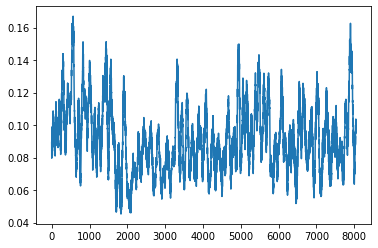

In [186]:
mse = tf.keras.losses.MeanSquaredError()
AE_Loss_0 = np.zeros([out_0.shape[0],5])
#for j in range(5):
j = 4
for i in range(out_0.shape[0]):
  asd_S0np = asd_S0[i,:,j].numpy()
  out_0np_2 = out_0np[i,:,:,j]

  AE_Loss_0[i,j] = float(mse(asd_S0np, out_0np_2))
plt.plot(AE_Loss_0[:,j])

for j in range(5):
    #j = 4
    for i in range(dat1.shape[0]):
        #plt.figure(figsize = [25,4])
        #fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))
        n_train = i+(0*i)#*120+5
        #out2_np = out2.numpy()
        #asd2_np = asd.numpy()
        #plt.figure(figsize = (35,4))
        asd_np = asd_S0_w[n_train,:]
        out_np = out2_np2[n_train,:]
        Loss_tr[i,j]=((float(mse(asd_np, out_np))))


In [144]:
AE_Loss_0.shape

(8046, 5)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """


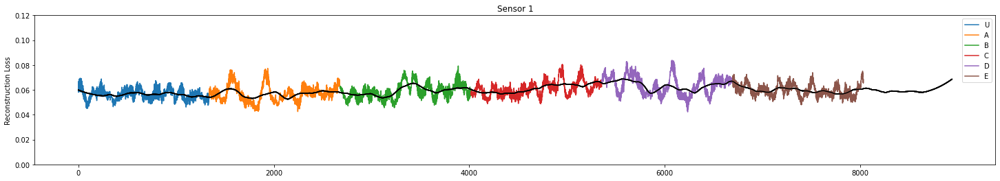

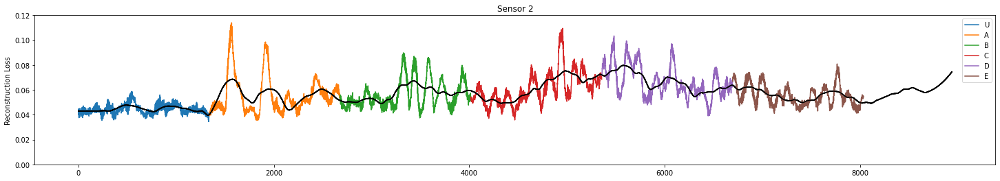

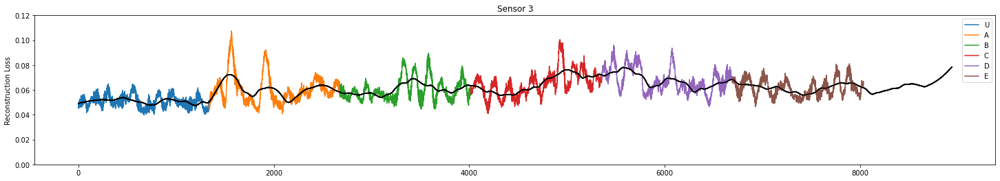

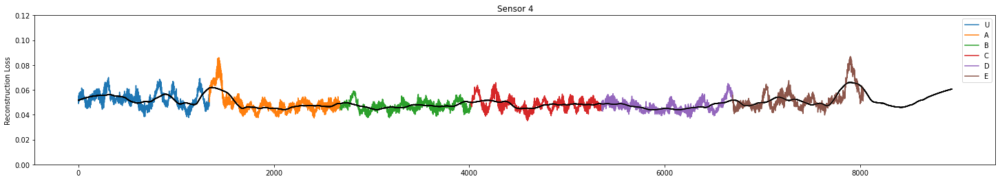

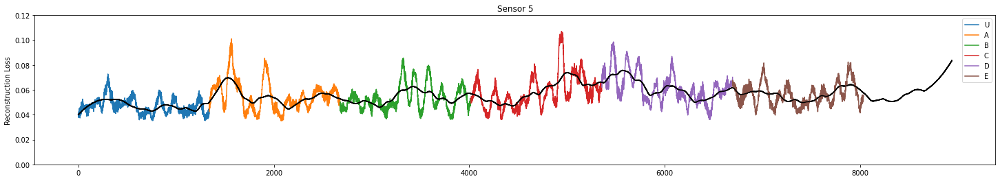

In [233]:
from scipy.signal import savgol_filter
#ax = plt.axes(projection='3d')
#ax.plot_wireframe(X, Y, Z, rstride=5, cstride=5)
x_ax = (np.linspace(0,len(AE_Loss_0),len(AE_Loss_0)))
seg_len = np.int((len(np.linspace(0,len(AE_Loss_0),len(AE_Loss_0)))-hx)/6)
#plt.figure(figsize = [32,6,2])
#plt.ylim([0,0.25])
leg=['U','A','B','C','D','E']
titre=['Sensor 1','Sensor 2','Sensor 3','Sensor 4','Sensor 5']
Filen = 'n_plt_num_F_03_19_0018_'

yl = [[0, 0.8],[],[],[],[]]
for j in range(5):
  #j = 4
  plt.figure(figsize = [25,4])
  plt.title(titre[j])
  plt.ylim([0,0.12])
  for i in range(6):
      plt.plot(x_ax[(i)*seg_len:(i+1)*seg_len],Loss_tr[(i)*seg_len:(i+1)*seg_len,j],label=leg[i])
      yhat = savgol_filter(Loss_tr[:,j], 501, 2) # window size 51, polynomial order 3
      plt.plot(yhat, color='black')
      plt.legend()
      plt.ylabel('Reconstruction Loss')
  plt.savefig(Filen+str(j)+'_.pdf')


    #plt.plot(x,y)
    #plt.plot(yhat,j color='red')
#plt.show()

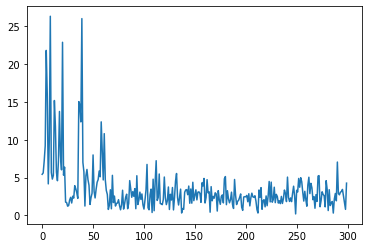

In [76]:

asd_fft = (np.abs(np.fft.fftshift(np.fft.fft((asd_np)))))
plt.plot(asd_fft[int(asd_fft.shape[0]/2):(asd_fft.shape[0])])

In [279]:
print(out2.shape)

(8940, 600, 1)


tf.Tensor(0.0740680992603302, shape=(), dtype=float64)
tf.Tensor(0.07896735519170761, shape=(), dtype=float64)
tf.Tensor(0.07633285969495773, shape=(), dtype=float64)
tf.Tensor(0.07598905265331268, shape=(), dtype=float64)
tf.Tensor(0.08131440728902817, shape=(), dtype=float64)
tf.Tensor(0.07841520011425018, shape=(), dtype=float64)
tf.Tensor(0.0769542008638382, shape=(), dtype=float64)
tf.Tensor(0.08250942826271057, shape=(), dtype=float64)
tf.Tensor(0.07830259948968887, shape=(), dtype=float64)
tf.Tensor(0.07651174813508987, shape=(), dtype=float64)


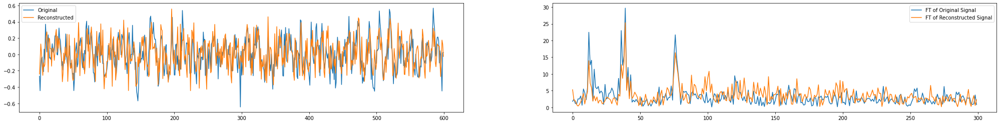

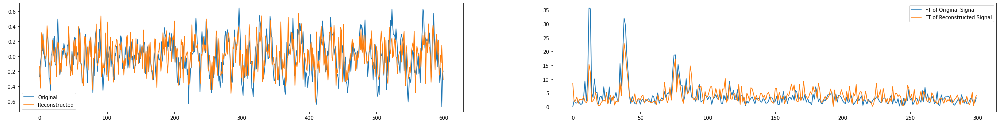

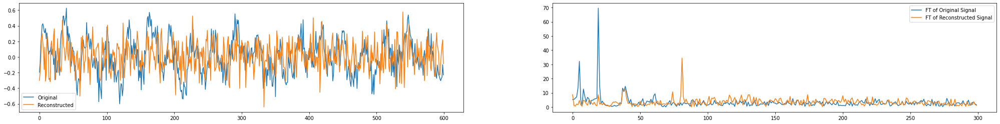

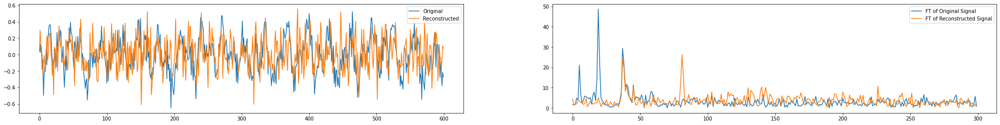

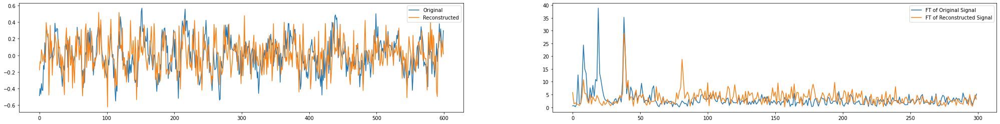

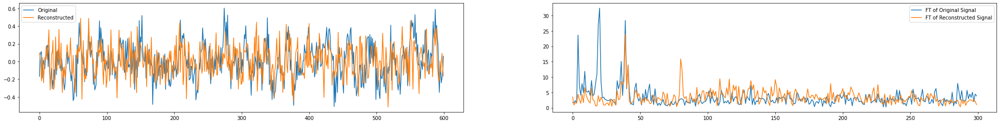

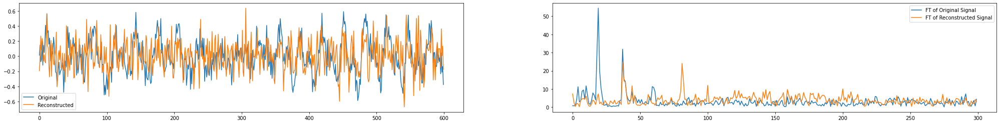

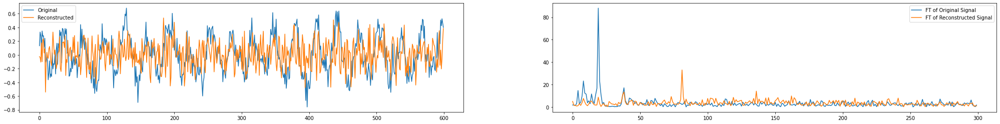

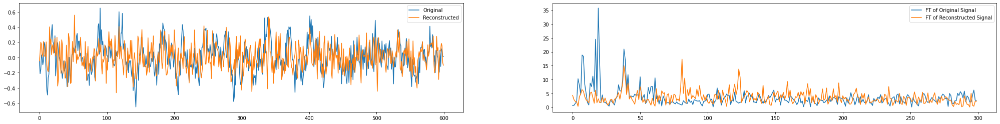

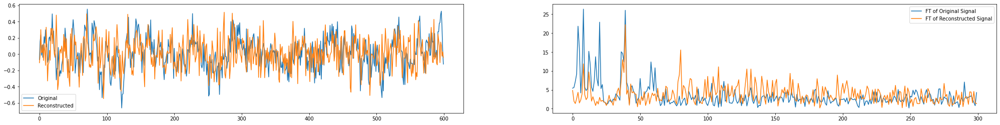

In [281]:

o3 = ae_5_F2.encoder(asd_S0[:,:,4])
out2 = ae_5_F2.decoder(o3)
#print(tf.shape(out2))


#fig, ax = plt.subplots(2, 5, sharex='col', sharey='row', figsize = (6,15), dpi = 140)
plt_name = 'trial_recons_different_cases_w_Fft'
j = 4
for i in range(10):
    #plt.figure(figsize = [25,4])
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))
    n_train = i+(800*i)#*120+5
    #out2_np = out2.numpy()
    #asd2_np = asd.numpy()
    #plt.figure(figsize = (35,4))
    ax1.plot(asd_S0[n_train,:,j].numpy(), label='Original')
    ax1.plot(out_0np[n_train,:,:,j], label='Reconstructed')
    ax1.legend()
    print(str(mse(asd_S0[i,:,j].numpy(), out_0np[i,:,:,j])))
    asd_np = asd_S0[n_train,:,j].numpy()
    asd_fft = (np.abs(np.fft.fftshift(np.fft.fft((asd_np)))))
    out_np = out2[n_train,:,0]
    out_fft = (np.abs(np.fft.fftshift(np.fft.fft((out_np)))))
    ax2.plot(asd_fft[int(asd_fft.shape[0]/2):(asd_fft.shape[0])], label='FT of Original Signal')
    ax2.plot(out_fft[int(out_fft.shape[0]/2):(out_fft.shape[0])], label='FT of Reconstructed Signal')
    #ax2.plot(np.fft.fft(asd_np), label='Original')
    #print(out2_np[0,:,:].shape)
    ax2.legend()
    plt.savefig(plt_name+str(i)+'.pdf')
    #pickle.dump(fig_object,open((plt_name+str(i)+'.pickle'),'wb'))

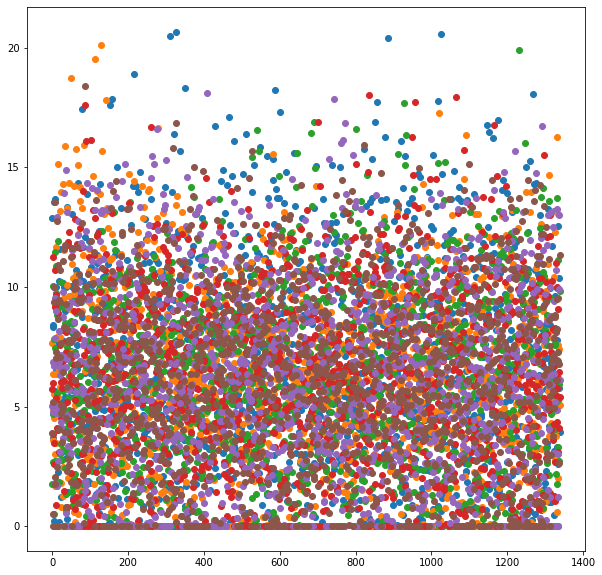

In [235]:
#plt.plot((o_0[:,0]),o_0[:,5])

a=0
plt.figure(figsize=[10,10])
for k in range(6):
    #plt.plot(x_ax[(i)*seg_len:(i+1)*seg_len],AE_Loss_0[(i)*seg_len:(i+1)*seg_len])
    #yhat = savgol_filter(AE_Loss_0, 501, 2) # window size 51, polynomial order 3
    #for i in range(10):
    #    for j in range(10):
          #plt.subplot(4, 25, a)
    
    plt.plot((o_0[(k)*seg_len:(k+1)*seg_len,1]) ,'o')




In [ ]:

o_0np = np.zeros([asd_S0.shape[0],100,asd_S0.shape[2]])
out_0np = np.zeros([asd_S0.shape[0],asd_S0.shape[1],1,asd_S0.shape[2]])



#for i in range(5):
i = 2
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_1_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_1_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()



i = 0
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_1_2_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_1_2_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

i = 3
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_4_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_4_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

i = 4
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_5_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_5_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

In [262]:
print(dat1_test[0,:,0].shape)
print(asd_S0[0,:,1].shape)

(600,)
(600,)


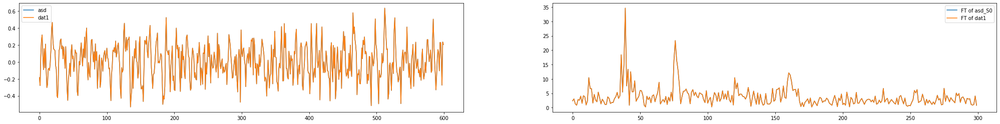

In [263]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))
ax1.plot(asd_S0[0,:,1],label = 'asd')
asd_np = asd_S0[0,:,1]
asd_fft = (np.abs(np.fft.fftshift(np.fft.fft((asd_np)))))
ax2.plot(asd_fft[int(asd_fft.shape[0]/2):(asd_fft.shape[0])], label='FT of asd_S0')
ax1.legend()
ax1.plot(dat1_test[0,:,:],label = 'dat1')
ax1.legend()
out_np = dat1_test[0,:,0]
out_fft = (np.abs(np.fft.fftshift(np.fft.fft((out_np)))))
ax2.plot(out_fft[int(out_fft.shape[0]/2):(out_fft.shape[0])], label='FT of dat1')
ax2.legend()

tf.Tensor(0.043467414, shape=(), dtype=float32)
tf.Tensor(0.05086769, shape=(), dtype=float32)
tf.Tensor(0.0725405, shape=(), dtype=float32)
tf.Tensor(0.06441233, shape=(), dtype=float32)
tf.Tensor(0.050109003, shape=(), dtype=float32)
tf.Tensor(0.055648327, shape=(), dtype=float32)
tf.Tensor(0.072394945, shape=(), dtype=float32)
tf.Tensor(0.09208638, shape=(), dtype=float32)
tf.Tensor(0.057064284, shape=(), dtype=float32)
tf.Tensor(0.050191827, shape=(), dtype=float32)


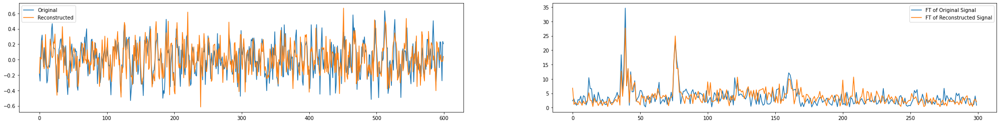

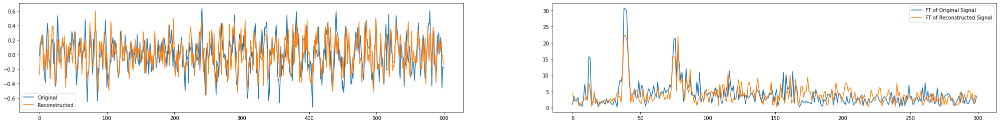

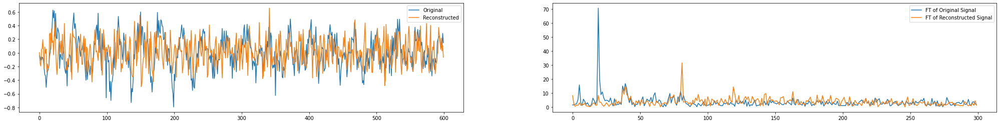

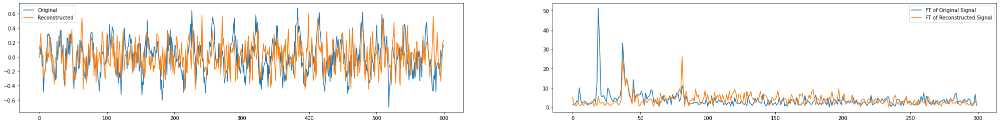

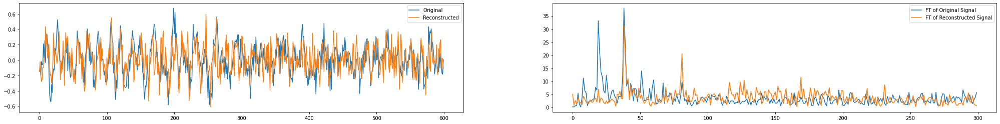

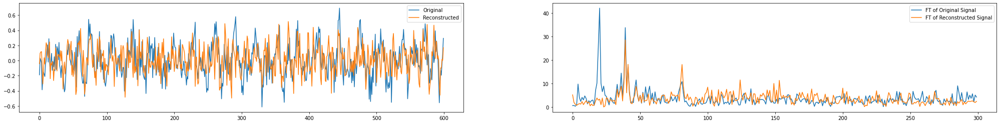

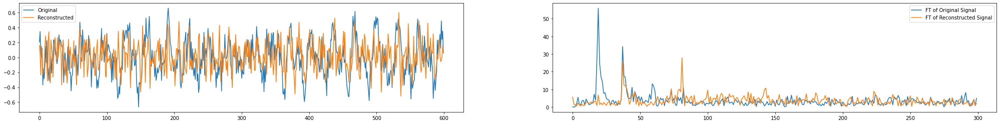

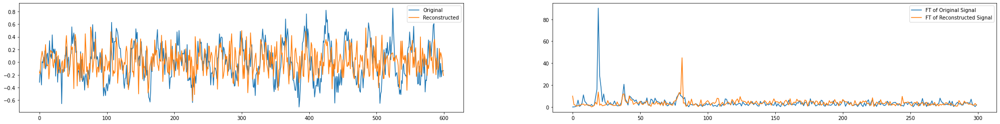

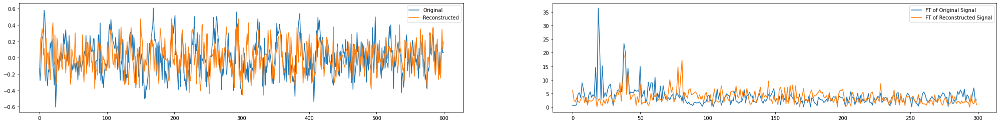

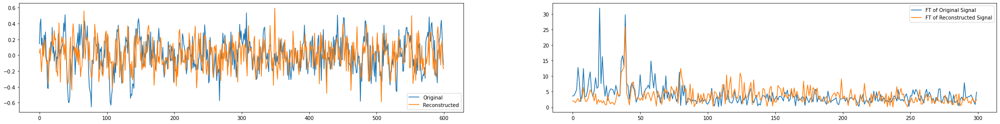

In [269]:

#fig, ax = plt.subplots(2, 5, sharex='col', sharey='row', figsize = (6,15), dpi = 140)

i = 1
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_1_1_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_1_1_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

plt_name = 'Actual_recons_Sensor1_w_Fft_19_00_58'
j = 1
for i in range(10):
    #plt.figure(figsize = [25,4])
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))
    n_train = i+(800*i)#*120+5
    #out2_np = out2.numpy()
    #asd2_np = asd.numpy()
    #plt.figure(figsize = (35,4))
    ax1.plot(dat1_test[n_train,:,:], label='Original')
    ax1.plot(out_0[n_train,:,:].numpy(), label='Reconstructed')
    ax1.legend()
    
    
    asd_np = dat1_test[n_train,:,0]
    asd_fft = (np.abs(np.fft.fftshift(np.fft.fft((asd_np)))))
    out_np = out_0[n_train,:,0].numpy()
    out_fft = (np.abs(np.fft.fftshift(np.fft.fft((out_np)))))
    #ax1.text(-0.4,300,str(mse(asd_np, out_np)))
    print(mse(asd_np, out_np))
    ax2.plot(asd_fft[int(asd_fft.shape[0]/2):(asd_fft.shape[0])], label='FT of Original Signal')
    ax2.plot(out_fft[int(out_fft.shape[0]/2):(out_fft.shape[0])], label='FT of Reconstructed Signal')
    #ax2.plot(np.fft.fft(asd_np), label='Original')
    #print(out2_np[0,:,:].shape)
    ax2.legend()
    plt.savefig(plt_name+str(i)+'.pdf')
    #pickle.dump(fig_object,open((plt_name+str(i)+'.pickle'),'wb'))

In [ ]:
i = 0
dat1_test = np.reshape(dat1[:,:,i],(dat1.shape[0],dat1.shape[1],1))
o_0 = ae_1_F_2.encoder(dat1_test)
o_0np[:,:,i] = o_0.numpy()
out_0 = ae_1_F_2.decoder(o_0)
out_0np[:,:,:,i] = out_0.numpy()

plt_name = 'Actual_recons_Sensor1_w_Fft_19_00_58'
j = 0
for i in range(10):
    #plt.figure(figsize = [25,4])
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (35,4))
    n_train = i+(800*i)#*120+5
    #out2_np = out2.numpy()
    #asd2_np = asd.numpy()
    #plt.figure(figsize = (35,4))
    ax1.plot(dat1_test, label='Original')
    ax1.plot(out_0.numpy(), label='Reconstructed')
    ax1.legend()
    print(str(mse(dat1_test, out_0.numpy())))
    asd_np = out_0.numpy()
    asd_fft = (np.abs(np.fft.fftshift(np.fft.fft((asd_np)))))
    out_np = out_0.numpy()
    out_fft = (np.abs(np.fft.fftshift(np.fft.fft((out_np)))))
    ax2.plot(asd_fft[int(asd_fft.shape[0]/2):(asd_fft.shape[0])], label='FT of Original Signal')
    ax2.plot(out_fft[int(out_fft.shape[0]/2):(out_fft.shape[0])], label='FT of Reconstructed Signal')
    #ax2.plot(np.fft.fft(asd_np), label='Original')
    #print(out2_np[0,:,:].shape)
    ax2.legend()
    plt.savefig(plt_name+str(i)+'.pdf')
    #pickle.dump(fig_object,open((plt_name+str(i)+'.pickle'),'wb'))